# Synopsis

# Setup

## Config

In [11]:
# novels wosds wosml lsi airbnb anphoblacht winereviews dscourses faulkner fra
project_slug = 'winereviews'
base_path  = '/Users/rca2t/Dropbox/CODE/polo2-test/projects'
# label_col = 'doc_label'
label_col = 'maxtopic'
lda_trial  = '20topics'

In [12]:
import sqlite3
import pandas as pd
import numpy as np
import plotly_express as px

## Pragmas

In [13]:
%matplotlib inline

# Process

## Get PCA Data

In [14]:
def get_files():
    corpus_db_file = '{0}/{1}/{1}-corpus.db'.format(base_path, project_slug)
    mallet_db_file = '{0}/{1}/{1}-mallet-{2}.db'.format(base_path, project_slug, lda_trial)
    return corpus_db_file, mallet_db_file 

In [15]:
corpus_db_file, mallet_db_file = get_files()

In [16]:
with sqlite3.connect(corpus_db_file) as db:
    docs = pd.read_sql('select * from doc where doc_label is not null', db, index_col='doc_id')
    vocab = pd.read_sql("select * from token", db, index_col=['token_id'])
    pca_items = pd.read_sql("select * from pca_item", db, index_col=['pc_id'])
    pca_docs = pd.read_sql("select * from pca_doc order by random() limit 10000", db, index_col=['doc_id'])
    pca_terms = pd.read_sql("select * from pca_term", db, index_col=['token_id'])

In [17]:
with sqlite3.connect(mallet_db_file) as db:
    docs2 = pd.read_sql("select * from doc", db, index_col=['doc_id'])
    doctopics = pd.read_sql("select * from doctopic", db, index_col=['doc_id','topic_id'])
    topicwords = pd.read_sql("select * from topicword", db, index_col=['word_id','topic_id'])
    topics = pd.read_sql("select * from topic", db)
    words = pd.read_sql("select * from word", db, index_col=['word_id'])
docs['maxtopic'] = docs2['maxtopic'].apply(lambda x: 'T{}'.format(x))

In [8]:
docs.head()

,doc_key,doc_title,doc_label,doc_province,doc_points,doc_price,doc_content,doc_original,doc_variety,doc_taster,doc_place,token_count,doc_sentiment_polarity,doc_sentiment_subjectivity,maxtopic
doc_id,,,,,,,,,,,,,,,
0,0,0: Nicosia 2013 Vulkà Bianco (Etna) Vulkà Bia...,Italy,Sicily & Sardinia,87,NaN,"Aromas include tropical fruit, broom, brimston...","Aromas include tropical fruit, broom, brimston...",White Blend,Kerin O’Keefe,Italy Sicily & Sardinia Etna,20,0.1,0.73,T13
1,1,1: Quinta dos Avidagos 2011 Avidagos Red (Dour...,Portugal,Douro,87,15.0,"This is ripe and fruity, a wine that is smooth...","This is ripe and fruity, a wine that is smooth...",Portuguese Red,Roger Voss,Portugal Douro,19,0.2,0.46,T12
2,2,2: Rainstorm 2013 Pinot Gris (Willamette Valle...,US,Oregon,87,14.0,"Tart and snappy, the flavors of lime flesh and...","Tart and snappy, the flavors of lime flesh and...",Pinot Gris,Paul Gregutt,US Oregon Willamette Valley Willamette Valley,16,0.0,0.36,T5
3,3,3: St. Julian 2013 Reserve Late Harvest Riesli...,US,Michigan,87,13.0,"Pineapple rind, lemon pith and orange blossom ...","Pineapple rind, lemon pith and orange blossom ...",Riesling,Alexander Peartree,US Michigan Lake Michigan Shore,20,0.2,0.33,T5
4,4,4: Sweet Cheeks 2012 Vintner's Reserve Wild Ch...,US,Oregon,87,65.0,"Much like the regular bottling from 2012, this...","Much like the regular bottling from 2012, this...",Pinot Noir,Paul Gregutt,US Oregon Willamette Valley Willamette Valley,22,0.3,0.45,T2


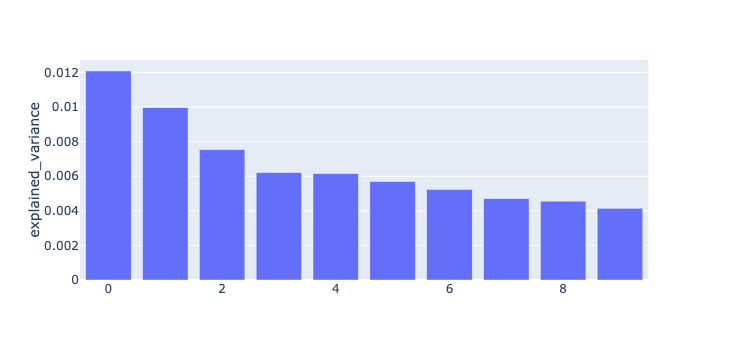

In [9]:
px.bar(pca_items, y='explained_variance', height=300, width=500)

## Bind components to doc and word tables

In [10]:
V = vocab.join(pca_terms, on='token_id', how='inner', rsuffix='_x')
D = docs.join(pca_docs, on='doc_id', how='inner')
COMPS = [col for col in pca_terms.columns if 'PC' in col]
pc_k = len(COMPS)

## Inspect components

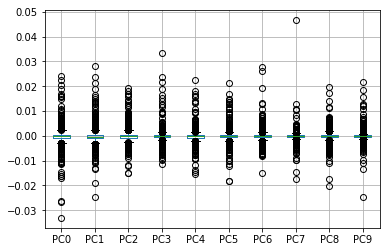

In [11]:
V[COMPS].boxplot()

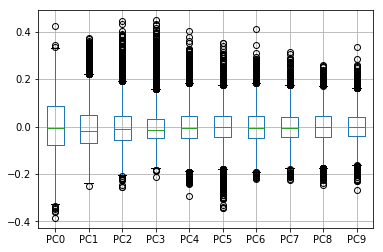

In [12]:
D[COMPS].boxplot()

## Show table contents

In [13]:
V[COMPS].head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
token_id,,,,,,,,,,
95,-0.000531,-0.001309,0.000537,-0.000441,0.000563,0.000684,0.000040,-0.000071,0.000118,-0.000520
96,-0.000703,-0.001223,0.000503,0.000002,-0.000870,-0.000460,0.000722,-0.000776,0.000393,0.000104
99,-0.000921,-0.001428,-0.000437,-0.000253,0.000357,0.000420,0.000555,0.001053,0.000679,0.000311
119,-0.000967,0.000182,0.001441,0.000467,-0.000058,-0.000387,0.001011,-0.000219,0.000121,-0.000292
192,0.000296,-0.000634,-0.000591,-0.000022,0.000201,-0.000021,-0.000479,0.000688,0.000278,-0.000358


In [14]:
D[COMPS].head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_id,,,,,,,,,,
6,-0.014770,-0.056168,0.348646,0.088110,0.083131,0.000931,0.084188,-0.027010,-0.114898,-0.067442
13,-0.133158,-0.091154,-0.027594,-0.097971,0.029277,0.057119,0.019204,0.024870,-0.095824,0.136686
29,0.126341,-0.029050,-0.038984,0.014870,-0.076192,-0.016893,-0.036735,0.043036,0.049011,-0.019095
31,0.010674,-0.033035,0.034313,0.137313,-0.010783,-0.056453,-0.015551,0.124663,-0.018842,-0.069914
44,-0.061206,-0.139299,0.015743,-0.029989,0.173620,0.029891,-0.051379,0.004996,-0.039233,-0.062869


## Get component terms (loadings)

In [15]:
DX = D[[label_col]+COMPS]

In [16]:
topics.topic_gloss.values

array(['residual sugar', 'pinot noir', 'petite sirah', 'show nose',
       'black cherry', 'sauvignon blanc', 'pinot noir', 'one best',
       'cabernet sauvignon', 'black cherry', 'nero davola',
       'stainless steel', 'touriga nacional', 'stone fruit',
       'fruit flavors', 'berry flavors', 'residual sugar', 'pinot noir',
       'crisp acidity', 'full bodied'], dtype=object)

In [17]:
DX.head()

,maxtopic,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_id,,,,,,,,,,,
6,T4,-0.014770,-0.056168,0.348646,0.088110,0.083131,0.000931,0.084188,-0.027010,-0.114898,-0.067442
13,T4,-0.133158,-0.091154,-0.027594,-0.097971,0.029277,0.057119,0.019204,0.024870,-0.095824,0.136686
29,T11,0.126341,-0.029050,-0.038984,0.014870,-0.076192,-0.016893,-0.036735,0.043036,0.049011,-0.019095
31,T10,0.010674,-0.033035,0.034313,0.137313,-0.010783,-0.056453,-0.015551,0.124663,-0.018842,-0.069914
44,T15,-0.061206,-0.139299,0.015743,-0.029989,0.173620,0.029891,-0.051379,0.004996,-0.039233,-0.062869


In [18]:
topics['label'] = 'T' + topics.topic_id.astype('str') + ' ' + topics.topic_gloss.astype('str')

In [19]:
labels = {'T{}'.format(topics.loc[x].topic_id):topics.loc[x].label for x in topics.index}

In [20]:
px.scatter_3d(DX, x='PC0', y='PC1', z='PC2', labels=labels, color=label_col, height=1000, width=1000)

In [21]:
px.scatter_3d(DX, x='PC3', y='PC4', z='PC5', color=label_col, height=1000, width=1000)

In [22]:
def draw_pca(df, x=1, y=2):
    xname = 'PC{}'.format(x)
    yname = 'PC{}'.format(y)
    
    xlabel = '{}:\n- {}\n+ {}'.format(xname, pca_items.loc[x].neg, pca_items.loc[x].pos)
    ylabel = '{}:\n- {}\n+ {}'.format(yname, pca_items.loc[y].neg, pca_items.loc[y].pos)
    print(xlabel)
    print(ylabel)
    
    title = "{} vs {}".format(xname,yname)
    return px.scatter(df, 
                      x=xname, 
                      y=yname, 
                      color=label_col, 
                      marginal_x='violin', 
                      marginal_y='violin', 
#                       range_x = [-.5, .5],
#                       range_y = [-.5, .5],
                      title=title, 
                      height=700, 
                      width=800)

PC0:
- black tannins cherry cabernet blackberry plum dark berry chocolate spice licorice firm red pepper merlot
+ apple crisp citrus acidity lemon peach pear fresh white light lime fruity green bright clean
PC1:
- aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
+ fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years


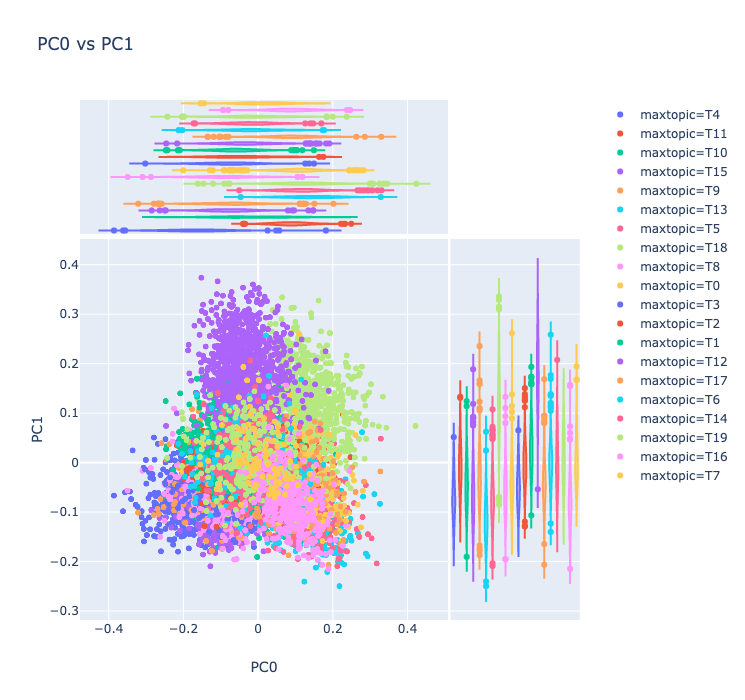

In [23]:
draw_pca(DX, 0, 1)

PC1:
- aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
+ fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years
PC2:
- flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic vanilla bit cherries
+ red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits


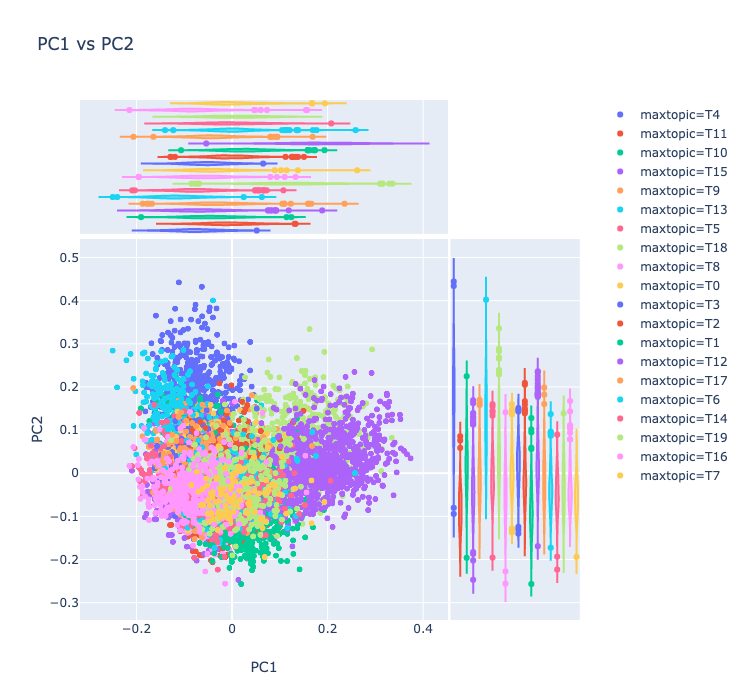

In [24]:
draw_pca(DX, 1, 2)

PC2:
- flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic vanilla bit cherries
+ red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits
PC3:
- ripe rich aromas finish wood dark fruit dense firm full plum concentrated aging peach berry
+ cabernet sauvignon blend merlot red light franc fruity crisp soft bright fresh petit verdot syrah


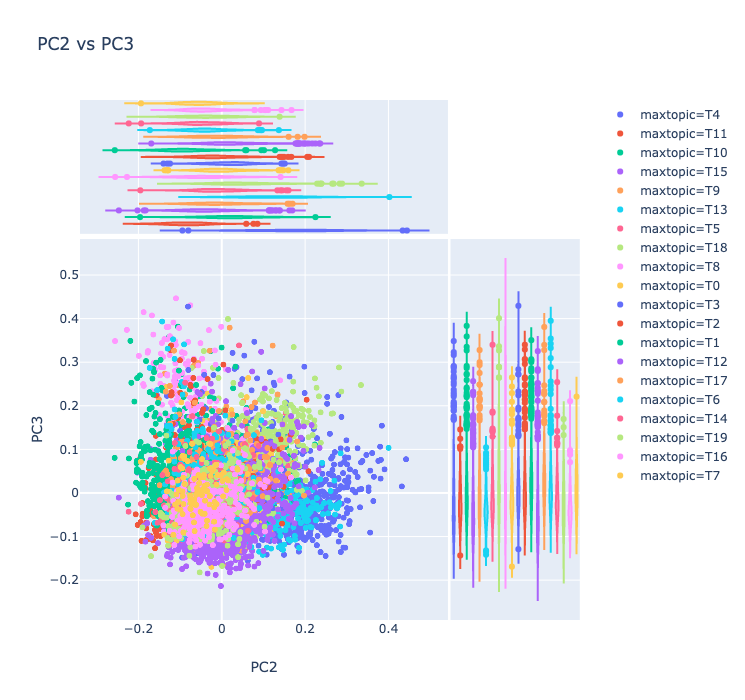

In [25]:
draw_pca(DX, 2, 3)

PC3:
- ripe rich aromas finish wood dark fruit dense firm full plum concentrated aging peach berry
+ cabernet sauvignon blend merlot red light franc fruity crisp soft bright fresh petit verdot syrah
PC4:
- white cabernet fruit sauvignon offers peach black alongside merlot blend pear rich dried yellow lemon
+ berry flavors plum finish red herbal light fruity soft feels fruits raspberry fresh aromas good


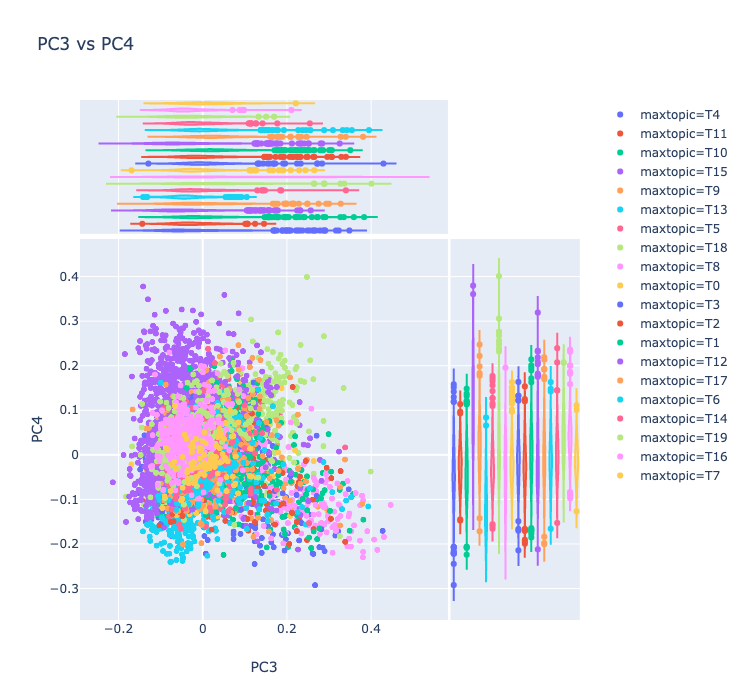

In [26]:
draw_pca(DX, 3, 4)

# Topics and Components

## Bind topics to doc table

In [27]:
dtm = doctopics.topic_weight.unstack()
TOPICS = ['T{}'.format(col) for col in dtm.columns]
t_k = len(TOPICS)
dtm.columns = TOPICS

In [28]:
try:
    D = D.join(dtm, on='doc_id', how='inner')
except ValueError as e:
    D = D.drop(TOPICS, 1)
    D = D.join(dtm, on='doc_id', how='inner')

## Bind topics to word table

In [29]:
twm = topicwords.word_count.unstack().fillna(0)
twm.columns = TOPICS

twm['token_str'] = words.word_str
twm['token_id'] = twm.token_str.map(V.reset_index().set_index('token_str')['token_id']).fillna(-1).astype('int')
twm = twm.reset_index(drop=True).set_index('token_id')

try:
    V = V.join(twm[TOPICS], on='token_id', how='inner')
except ValueError as e:
    V = V.drop(TOPICS, 1)
    V = V.join(twm[TOPICS], on='token_id', how='inner')

In [30]:
D['doc_label'].isna().value_counts()

False    9996
Name: doc_label, dtype: int64

## Correlate Topics and Components via Docs

## Simple dot product of topic and component matrices

In [31]:
X = D[TOPICS].T.dot(D[COMPS])
X.columns.name = 'pc_id'
X.index.name = 'topic_id'

## Find opposing topics per component

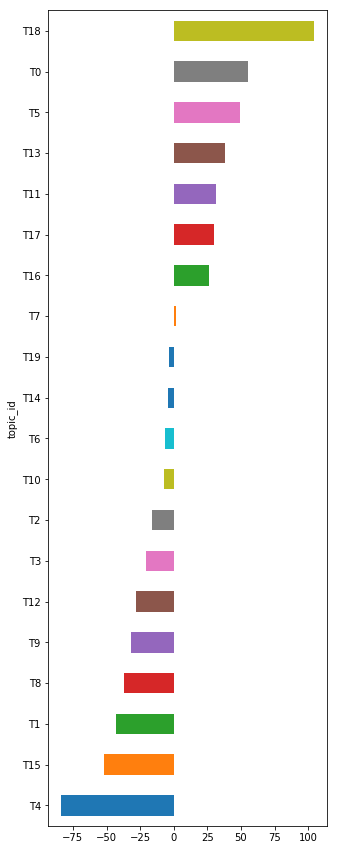

In [32]:
X['PC0'].sort_values().plot(kind='barh', figsize=(5, 15))

In [33]:
X.style.background_gradient(cmap='bwr')

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
topic_id,,,,,,,,,,
T0,55.5729,-19.0354,0.39232,-5.36108,-10.4598,-0.202635,-11.5384,-12.0148,29.1077,-22.4649
T1,-43.2937,19.1851,-61.21,22.3638,4.77177,-54.1536,3.50038,-39.9385,-20.6511,-1.17001
T2,-15.9005,-1.48955,-5.52653,5.25417,-10.369,-13.5085,-3.05447,-1.41248,8.03332,7.07907
T3,-20.5325,-14.3641,4.90219,2.93062,-3.45122,-10.4452,-12.0021,-0.708639,28.8282,0.08971
T4,-84.2304,-36.6016,90.102,-8.55657,-22.2918,-11.2928,10.1789,-10.8839,-20.6396,3.78477
T5,49.4875,-31.0905,-3.23861,-3.54116,-9.72408,9.74341,-2.9945,-4.17007,10.4863,-4.45884
T6,-6.54087,-0.563908,-14.9219,4.89819,-4.2082,-11.462,-8.61261,16.8617,-1.40615,2.63706
T7,1.35686,1.15327,-7.54175,1.57916,-3.27064,-4.14278,-2.78318,0.599031,-1.02168,-2.17758
T8,-37.1781,-18.1977,-16.2968,36.0176,-16.4185,23.9283,4.33167,19.0318,0.824749,2.73932


## Convert to narrow with absolute values

In [34]:
Y = X.unstack().to_frame().sort_values(0, ascending=False).rename(columns={0:'x'})
Y['abs'] = np.abs(Y.x)
Y['sign'] = np.sign(Y.x).astype('int')
Y = Y.reset_index().set_index(['topic_id', 'pc_id', 'sign'])
Y = Y.sort_index()

In [35]:
Y.head()

x        abs
topic_id pc_id sign                      
T0       PC0    1    55.572905  55.572905
         PC1   -1   -19.035352  19.035352
         PC2    1     0.392320   0.392320
         PC3   -1    -5.361083   5.361083
         PC4   -1   -10.459766  10.459766

In [36]:
# Y['abs'].unstack().T.style.background_gradient(cmap='viridis')

In [37]:
Y.sort_values('abs', ascending=True).head(10)

,,,x,abs
topic_id,pc_id,sign,,
T3,PC9,1,0.089710,0.089710
T0,PC5,-1,-0.202635,0.202635
T19,PC7,-1,-0.249163,0.249163
T0,PC2,1,0.392320,0.392320
T16,PC6,1,0.516261,0.516261
T14,PC1,-1,-0.559457,0.559457
T6,PC1,-1,-0.563908,0.563908
T13,PC9,-1,-0.571597,0.571597
T7,PC7,1,0.599031,0.599031


## Distribution of topic-components

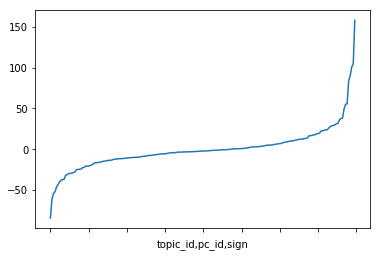

In [38]:
Y.x.sort_values().plot()

In [39]:
Y.describe().T

,count,mean,std,min,25%,50%,75%,max
x,200.0,0.036976,25.771527,-84.230429,-10.802446,-2.190125,6.668630,157.979915
abs,200.0,15.667334,20.432184,0.089710,3.411281,9.768733,19.879493,157.979915


## Extract common words between topics and components

In [40]:
def show_words(topic_id, pc_id, sign):
    w1 = V[['token_str', topic_id]].sort_values(topic_id, ascending=False).head(20).token_str.tolist()
    if sign == 1:
        w2 = V[['token_str', pc_id]].sort_values(pc_id, ascending=False).head(10).token_str.tolist()
    elif  sign == -1:
        w2 = V[['token_str', pc_id]].sort_values(pc_id, ascending=True).head(10).token_str.tolist()
    else:
        w2 = []
    common = list(set(w1) & set(w2))
    return ' '.join(common)

In [41]:
Y['words'] = Y.apply(lambda x: show_words(x.name[0], x.name[1], x.name[2]), 1)

In [42]:
Y['n_words'] = Y['words'].apply(lambda x: len(x.split()))

In [43]:
# Y[Y.n_words > 0].sort_values('abs', ascending=False)

In [44]:
Y.loc[Y.n_words >= 5].sort_values('abs', ascending=False).words.values

array(['ripe aging fruits structure rich acidity wood tannins character',
       'crisp light citrus acidity fresh apple',
       'ripe fruits fruity rich acidity character',
       'alongside red cherry berry acidity offers tannins',
       'spice cherry berry tannins black plum',
       'plum herbal berry finish flavors feels',
       'cabernet blackberry flavors rich sweet oak dry chocolate',
       'lemon peach citrus acidity fresh pear apple',
       'fruits herbal berry aromas finish plum',
       'pinot red cherries sweet cherry cola',
       'spice plum blackberry cherry berry tannins black chocolate',
       'crisp lemon peach white citrus acidity fresh pear apple',
       'nose cherry notes aromas finish flavors',
       'cabernet blackberry cherry tannins black chocolate',
       'currant blackberry rich black dry',
       'crisp peach white citrus acidity pear apple',
       'dense fruit ripe rich wood dark firm',
       'spice cabernet cherry tannins black',
       'cabern

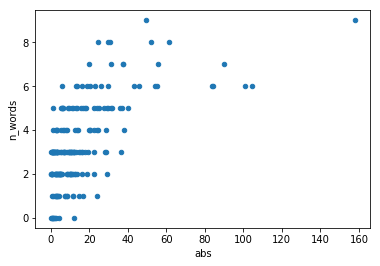

In [45]:
Y.plot(kind='scatter', x='abs', y='n_words')

## Compute Z scores

In [46]:
m = Y['abs'].mean()
s = np.sqrt(((Y['abs'] - m)**2).sum() / (Y.shape[0] - 1))
Y['z'] = (Y['abs'] - m) / s

In [47]:
Y.sort_values('z', ascending=False).head()

x         abs  \
topic_id pc_id sign                           
T12      PC1    1    157.979915  157.979915   
T18      PC0    1    104.514425  104.514425   
         PC1    1    100.801797  100.801797   
T4       PC2    1     90.101959   90.101959   
         PC0   -1    -84.230429   84.230429   

                                                                 words  \
topic_id pc_id sign                                                      
T12      PC1    1    ripe aging fruits structure rich acidity wood ...   
T18      PC0    1               crisp light citrus acidity fresh apple   
         PC1    1            ripe fruits fruity rich acidity character   
T4       PC2    1    alongside red cherry berry acidity offers tannins   
         PC0   -1                spice cherry berry tannins black plum   

                     n_words         z  
topic_id pc_id sign                     
T12      PC1    1          9  6.965119  
T18      PC0    1          6  4.348389  
         PC1    1          6  4.166685  
T4       PC2    1          7  3.643009  
         PC0   -1          6  3.355642

In [48]:
Y[Y.z > 2].sort_values('z', ascending=False)

x         abs  \
topic_id pc_id sign                           
T12      PC1    1    157.979915  157.979915   
T18      PC0    1    104.514425  104.514425   
         PC1    1    100.801797  100.801797   
T4       PC2    1     90.101959   90.101959   
         PC0   -1    -84.230429   84.230429   
T15      PC4    1     83.858049   83.858049   
T1       PC2   -1    -61.210009   61.210009   

                                                                 words  \
topic_id pc_id sign                                                      
T12      PC1    1    ripe aging fruits structure rich acidity wood ...   
T18      PC0    1               crisp light citrus acidity fresh apple   
         PC1    1            ripe fruits fruity rich acidity character   
T4       PC2    1    alongside red cherry berry acidity offers tannins   
         PC0   -1                spice cherry berry tannins black plum   
T15      PC4    1               plum herbal berry finish flavors feels   
T1       PC2   -1    cabernet blackberry flavors rich sweet oak dry...   

                     n_words         z  
topic_id pc_id sign                     
T12      PC1    1          9  6.965119  
T18      PC0    1          6  4.348389  
         PC1    1          6  4.166685  
T4       PC2    1          7  3.643009  
         PC0   -1          6  3.355642  
T15      PC4    1          6  3.337417  
T1       PC2   -1          8  2.228968

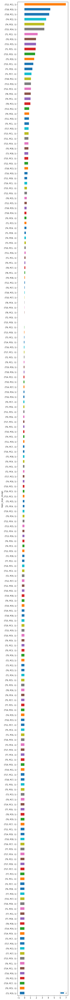

In [49]:
Y.sort_values('z').plot(kind='barh', y='z', figsize=(5,100))

In [50]:
Y.loc[('T2')].sort_values('z', ascending=False)

,,x,abs,words,n_words,z
pc_id,sign,,,,,
PC0,-1,-15.900525,15.900525,blackberry cherry dark tannins black,5,0.011413
PC5,-1,-13.508510,13.508510,red cherry,2,-0.105658
PC4,-1,-10.369038,10.369038,offers fruit black,3,-0.259311
PC8,1,8.033319,8.033319,soft pepper texture black,4,-0.373627
PC9,1,7.079071,7.079071,oak blackberry black acidity,4,-0.420330
PC2,-1,-5.526528,5.526528,oak blackberry,2,-0.496315
PC3,1,5.254166,5.254166,soft red,2,-0.509645
PC6,-1,-3.054471,3.054471,,0,-0.617304
PC1,-1,-1.489549,1.489549,finish offers cherry,3,-0.693895


## Plot Topics vs Components

In [51]:
def plot_pc_v_topic(pc_x, t_x, topic_weight_min = .5):
    pc_min = D[pc_x].min()
    pc_max = D[pc_x].max()
    D[D[t_x] >= topic_weight_min].reset_index()\
        .plot(kind='scatter', x=pc_x, y=t_x, figsize=(10,5), xlim=(pc_min, pc_max))

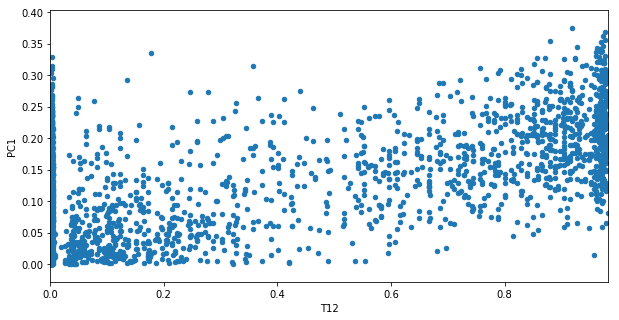

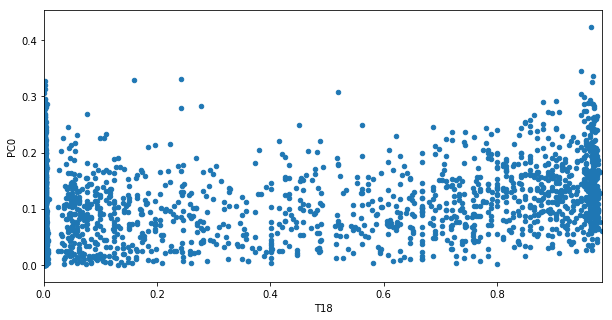

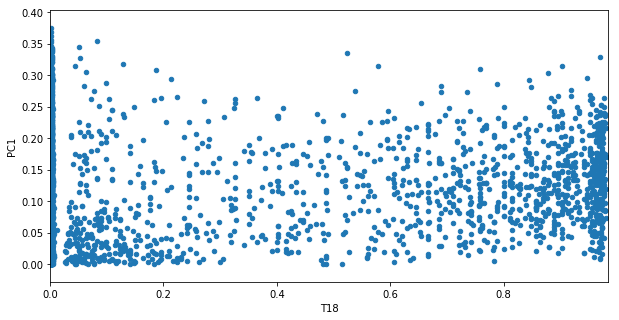

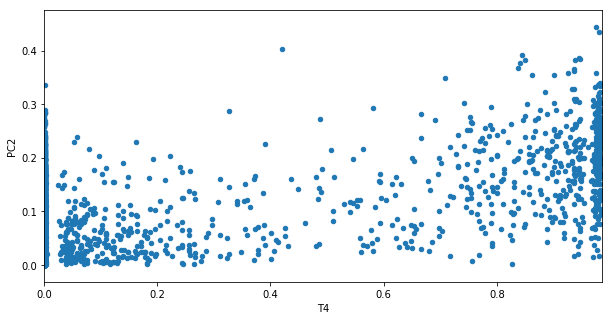

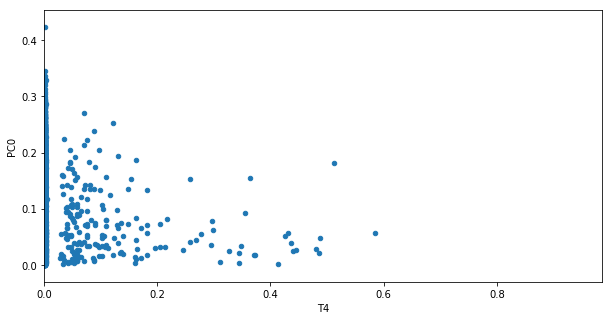

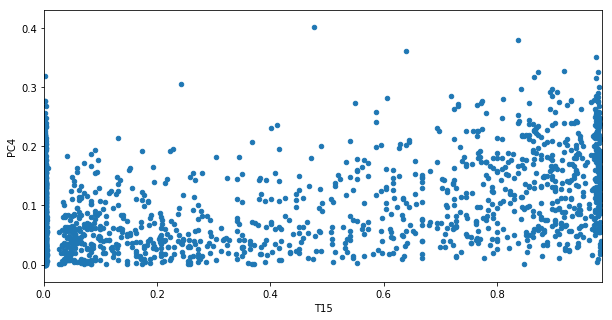

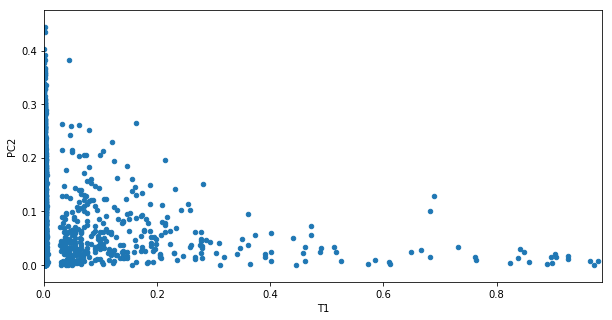

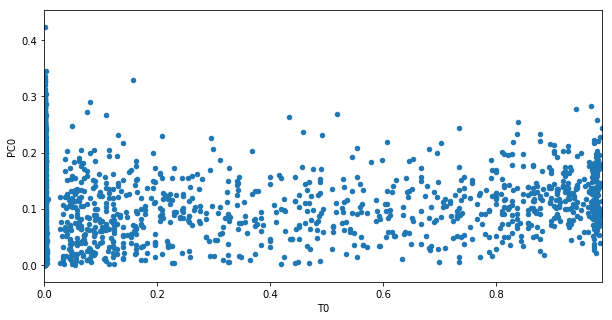

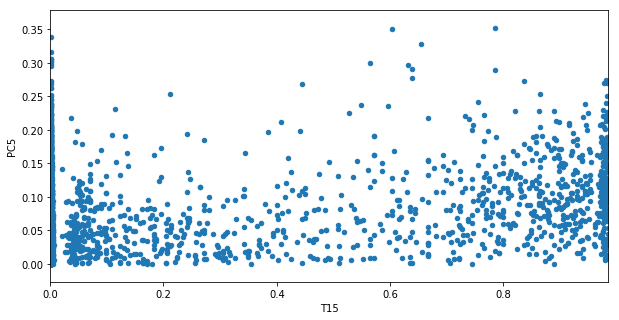

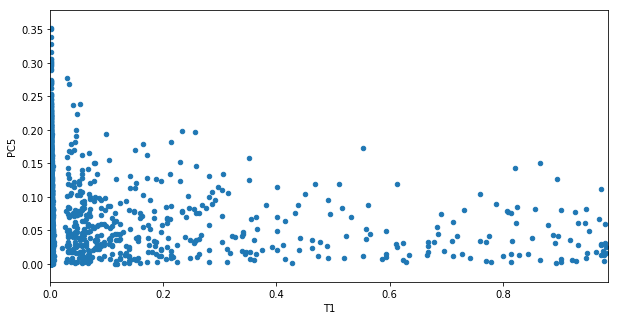

In [52]:
_ = Y.sort_values('abs', ascending=False).head(10).apply(lambda x: plot_pc_v_topic(x.name[0], x.name[1],  0), 1)

## Covariance 

In [53]:
COV = D[COMPS + TOPICS].cov().iloc[:pc_k, pc_k:]
CORR = D[COMPS + TOPICS].corr().iloc[:pc_k, pc_k:]

In [54]:
COV.T.style.background_gradient(cmap='bwr')

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
T0,0.00554632,-0.00196601,7.03233e-05,-0.000510747,-0.00104591,8.8656e-06,-0.00118814,-0.0012034,0.00292097,-0.00227614
T1,-0.00434972,0.00183808,-0.00608296,0.00227141,0.000478193,-0.00537952,0.000305605,-0.00399759,-0.00205458,-0.000154795
T2,-0.00160171,-0.000197607,-0.000528395,0.000545916,-0.00103696,-0.00132852,-0.000332226,-0.000142358,0.000810636,0.000685738
T3,-0.00206176,-0.00147062,0.000507383,0.000307163,-0.000344975,-0.00102918,-0.00121917,-7.16166e-05,0.00288902,-6.55603e-06
T4,-0.00844061,-0.00372175,0.00904489,-0.00083119,-0.00222972,-0.00110154,0.000985643,-0.00109021,-0.0020565,0.000350958
T5,0.00494038,-0.00315913,-0.000299515,-0.000334078,-0.000972432,0.000997813,-0.000326197,-0.000418255,0.00105605,-0.000468606
T6,-0.000664408,-0.000101133,-0.00147035,0.000508691,-0.000420604,-0.0011256,-0.0008862,0.00168606,-0.000134332,0.000243105
T7,0.000130627,9.24452e-05,-0.000742967,0.000167551,-0.000327009,-0.00040362,-0.00029103,5.94419e-05,-9.89593e-05,-0.000228503
T8,-0.0037298,-0.00186601,-0.00160761,0.00362245,-0.00164224,0.0024155,0.000408543,0.00190316,8.89556e-05,0.000253056
T9,-0.00317165,-0.00138434,-0.00017088,8.32901e-05,0.000918486,-0.000441885,0.000503427,0.000291393,0.00178665,-0.000581832


In [55]:
CORR.T.style.background_gradient(cmap='bwr')

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
T0,0.260167,-0.101925,0.00418425,-0.0337128,-0.0684925,0.000608505,-0.0838754,-0.0908707,0.221945,-0.182824
T1,-0.179943,0.0840396,-0.319197,0.132224,0.027617,-0.325631,0.0190263,-0.266219,-0.137679,-0.0109652
T2,-0.0897916,-0.0122434,-0.0375737,0.0430646,-0.0811551,-0.108976,-0.0280289,-0.0128471,0.0736124,0.0658263
T3,-0.129515,-0.102101,0.0404288,0.0271515,-0.0302532,-0.0945982,-0.115257,-0.00724212,0.293972,-0.0007052
T4,-0.378525,-0.184465,0.514512,-0.052452,-0.139596,-0.0722823,0.0665212,-0.0787046,-0.14939,0.0269503
T5,0.282202,-0.199441,-0.0217015,-0.0268528,-0.0775462,0.0833985,-0.0280414,-0.03846,0.0977137,-0.045835
T6,-0.039858,-0.00670531,-0.111885,0.0429414,-0.0352253,-0.0988038,-0.0800078,0.162825,-0.0130536,0.0249726
T7,0.0158429,0.0123917,-0.114299,0.028595,-0.0553683,-0.071628,-0.0531201,0.0116055,-0.0194415,-0.0474549
T8,-0.221299,-0.122364,-0.120989,0.302439,-0.136029,0.209706,0.0364798,0.181776,0.00854948,0.0257098
T9,-0.174016,-0.0839447,-0.0118923,0.00643041,0.0703521,-0.0354749,0.0415681,0.0257366,0.158787,-0.0546624


In [56]:
Y['cov'] = COV.stack()
Y['corr'] = CORR.stack()

In [57]:
# pd.plotting.scatter_matrix(Y[['x','abs','z','cov','corr']], figsize=(10,10))
# Y.plot(kind='scatter', x='x', y='corr')

In [58]:
Y.sort_values('corr', ascending=False).head()

x        abs  \
topic_id pc_id sign                         
T0       PC0    1    55.572905  55.572905   
         PC1   -1   -19.035352  19.035352   
         PC2    1     0.392320   0.392320   
         PC3   -1    -5.361083   5.361083   
         PC4   -1   -10.459766  10.459766   

                                                           words  n_words  \
topic_id pc_id sign                                                         
T0       PC0    1    lemon peach citrus acidity fresh pear apple        7   
         PC1   -1          nose peach notes finish flavors apple        6   
         PC2    1                                  fresh acidity        2   
         PC3   -1                              finish fruit ripe        3   
         PC4   -1                                    peach fruit        2   

                            z  cov  corr  
topic_id pc_id sign                       
T0       PC0    1    1.953074  NaN   NaN  
         PC1   -1    0.164839  NaN   NaN  
         PC2    1   -0.747596  NaN   NaN  
         PC3   -1   -0.504413  NaN   NaN  
         PC4   -1   -0.254871  NaN   NaN

#  Topics and Labels

In [59]:
TLM = D[['doc_label'] + TOPICS].groupby('doc_label').mean()

In [60]:
TLM.head()

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19
doc_label,,,,,,,,,,,,,,,,,,,,
Argentina,0.006204,0.023046,0.008334,0.004449,0.005579,0.023762,0.010382,0.021931,0.016639,0.014482,0.006593,0.007496,0.015395,0.002374,0.019797,0.617298,0.170175,0.007212,0.007173,0.011679
Australia,0.030482,0.021039,0.019602,0.005433,0.015215,0.104749,0.019274,0.073746,0.022315,0.345284,0.009016,0.039184,0.023603,0.014540,0.102118,0.028496,0.027719,0.046729,0.017698,0.033759
Austria,0.464944,0.020220,0.018294,0.004204,0.006442,0.021017,0.013704,0.018181,0.007259,0.019126,0.002912,0.010635,0.093592,0.006557,0.016970,0.006793,0.008013,0.019713,0.225111,0.016313
Brazil,0.036281,0.001877,0.001313,0.000816,0.001234,0.001347,0.001244,0.001158,0.001322,0.014249,0.001159,0.001085,0.140260,0.013465,0.001306,0.515010,0.218337,0.001129,0.046501,0.000907
Bulgaria,0.119293,0.026277,0.024009,0.000865,0.032735,0.009868,0.025513,0.010099,0.052474,0.546668,0.013603,0.001151,0.002370,0.024908,0.001386,0.066478,0.000959,0.038196,0.002186,0.000963


## Topic Entropy

In [61]:
topics.iloc[2].topic_words

'oak black cherry finish fruit acidity soft tannin red vineyard '

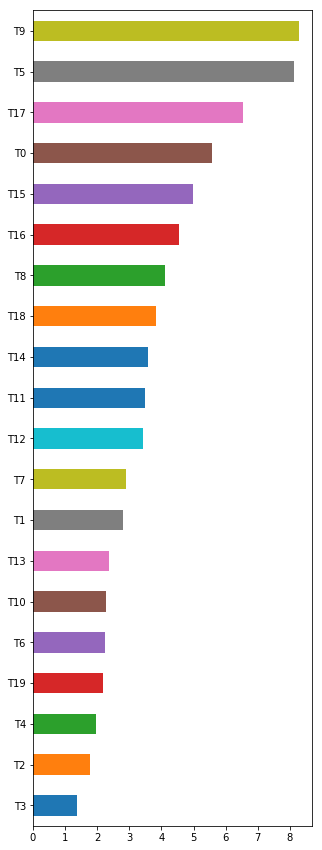

In [62]:
(TLM * np.log2(1/TLM)).sum().sort_values(ascending=True).plot(kind='barh', figsize=(5,15))

In [63]:
TLM.T.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Mexico,Moldova,Morocco,New Zealand,Portugal,Romania,Serbia,Slovenia,South Africa,Spain,Turkey,US,Uruguay
T0,0.00620399,0.0304817,0.464944,0.036281,0.119293,0.0556948,0.00898354,0.281816,0.00138336,0.392636,0.887513,0.066989,0.00141866,0.732661,0.00793767,0.0932624,0.0048724,0.0109185,0.0011349,0.00140891,0.00112436,0.00133448,0.2297,0.0321691,0.0127101,0.142468,0.00128924,0.0210652,0.0289868,0.00766171,0.00134318,0.0435648,0.0013571
T1,0.0230457,0.0210388,0.02022,0.00187741,0.0262767,0.0113606,0.018707,0.00191534,0.00176435,0.00151557,0.00114103,0.01406,0.00180937,0.0100135,0.0246127,0.0683875,0.0200257,0.0113307,0.015604,0.00179694,0.0404101,0.00170201,0.00220658,0.0282406,0.0140003,0.00984039,0.00164431,0.00190395,0.0141793,0.0145558,0.0017131,0.165805,0.00173086
T2,0.0083341,0.0196025,0.0182938,0.00131309,0.0240085,0.00523719,0.00657205,0.00133962,0.00123401,0.00106001,0.00728378,0.0080785,0.0012655,0.00469783,0.0116815,0.00142584,0.0202564,0.00720033,0.00101237,0.0012568,0.00100297,0.00119041,0.00154332,0.0212474,0.00554937,0.00154002,0.00115005,0.00906698,0.00508172,0.00875491,0.0119821,0.0993317,0.00121059
T3,0.00444876,0.00543345,0.00420448,0.000815528,0.000865493,0.0347275,0.00631851,0.000832005,0.000766415,0.000658349,0.00049565,0.00423047,0.0377472,0.00437368,0.0147001,0.000885552,0.00497668,0.00456439,0.000628758,0.00078057,0.00062292,0.000739334,0.000958517,0.0154297,0.00298286,0.000956471,0.000714269,0.000827057,0.0151131,0.00471825,0.000744151,0.0696961,0.000751866
T4,0.00557913,0.015215,0.00644163,0.00123392,0.0327346,0.00126377,0.00742951,0.00125885,0.00115961,0.000996105,0.000749935,0.00750544,0.0011892,0.00429623,0.0365261,0.00133987,0.0150167,0.327722,0.000951333,0.00118103,0.000942499,0.00111864,0.00145027,0.00541922,0.00718051,0.0260544,0.00108071,0.00898669,0.0138316,0.00977709,0.00112593,0.00976575,0.0011376
T5,0.0237622,0.104749,0.0210168,0.00134738,0.00986847,0.0730667,0.0567011,0.108837,0.00126624,0.0010877,0.0786476,0.0280898,0.020296,0.0326526,0.0496634,0.13782,0.147147,0.0170298,0.208311,0.372585,0.00810746,0.179681,0.742486,0.215159,0.00844148,0.197104,0.00118009,0.482258,0.205542,0.0438695,0.269673,0.0566795,0.0012422
T6,0.0103816,0.019274,0.0137041,0.00124359,0.0255126,0.275135,0.00822621,0.0110897,0.0011687,0.00100391,0.000755812,0.00872037,0.00798845,0.00988794,0.0028032,0.00135037,0.00875053,0.00637113,0.000958788,0.00119029,0.000949885,0.0147073,0.00146163,0.0205027,0.00613713,0.00722361,0.00108918,0.00126117,0.0104418,0.00882827,0.00113475,0.0890898,0.00114651
T7,0.0219315,0.0737458,0.0181813,0.00115756,0.0100987,0.039176,0.0275077,0.0707108,0.00108785,0.0400793,0.000703527,0.0188715,0.00111561,0.0157267,0.024142,0.00125696,0.00193302,0.016665,0.000892462,0.00110794,0.000884175,0.0435192,0.00136052,0.0844152,0.0224089,0.00135762,0.00101384,0.00117393,0.017158,0.0206646,0.00105625,0.0217963,0.0010672
T8,0.0166386,0.0223151,0.0072592,0.00132214,0.0524744,0.0702059,0.0183685,0.0181228,0.00124251,0.353371,0.000803548,0.0103252,0.00127422,0.0041334,0.0223593,0.0259012,0.0526991,0.0214198,0.0531949,0.00126546,0.101628,0.136997,0.00155395,0.00833963,0.00777792,0.0293938,0.00115797,0.00134083,0.02563,0.0101174,0.0119903,0.0829566,0.00121893
T9,0.0144821,0.345284,0.0191259,0.0142494,0.546668,0.0386606,0.0132222,0.0505934,0.0257067,0.00117792,0.000886814,0.0443851,0.521528,0.0419434,0.145966,0.258721,0.591423,0.0155466,0.275169,0.00139659,0.0243205,0.418523,0.00171497,0.31772,0.0159871,0.0651273,0.935613,0.266845,0.428291,0.0141392,0.318572,0.0404326,0.00134523


In [64]:
TLM.idxmax(1).sort_values()

doc_label
Austria            T0
Croatia            T0
Czech Republic     T0
England            T0
Germany            T0
US                 T1
Portugal          T12
Argentina         T15
Spain             T15
Brazil            T15
Mexico            T15
Chile             T15
Uruguay           T16
Greece            T17
Cyprus            T17
Romania           T17
Luxembourg        T17
France            T18
Italy              T4
Slovenia           T5
Morocco            T5
Canada             T6
Moldova            T9
Georgia            T9
New Zealand        T9
Bulgaria           T9
Lebanon            T9
Serbia             T9
Hungary            T9
South Africa       T9
Australia          T9
Turkey             T9
Israel             T9
dtype: object

In [65]:
(TLM / TLM.sum()).T.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Mexico,Moldova,Morocco,New Zealand,Portugal,Romania,Serbia,Slovenia,South Africa,Spain,Turkey,US,Uruguay
T0,0.001663,0.0081707,0.12463,0.00972522,0.0319767,0.0149292,0.00240806,0.0755417,0.000370815,0.105247,0.2379,0.0179566,0.000380276,0.196392,0.00212772,0.0249993,0.00130606,0.00292674,0.000304212,0.000377663,0.000301387,0.000357712,0.0615718,0.00862302,0.00340698,0.038189,0.000345585,0.00564659,0.00776998,0.00205374,0.000360043,0.0116777,0.000363775
T1,0.0387692,0.0353929,0.0340154,0.00315831,0.0442045,0.0191115,0.0314701,0.00322212,0.00296811,0.0025496,0.00191951,0.0236527,0.00304384,0.0168454,0.0414052,0.115046,0.0336886,0.0190613,0.0262502,0.00302293,0.0679807,0.00286323,0.00371207,0.0475083,0.0235523,0.0165542,0.00276616,0.00320296,0.0238534,0.0244867,0.00288189,0.278929,0.00291177
T2,0.0260599,0.061295,0.0572031,0.0041059,0.0750724,0.0163762,0.0205502,0.00418886,0.00385864,0.00331456,0.0227757,0.0252607,0.00395709,0.0146896,0.0365269,0.00445845,0.0633397,0.0225147,0.00316558,0.0039299,0.00313619,0.00372229,0.0048258,0.0664386,0.0173523,0.0048155,0.0035961,0.0283516,0.01589,0.0273758,0.0374668,0.310601,0.00378538
T3,0.0180325,0.0220238,0.0170423,0.00330564,0.00350816,0.140764,0.0256113,0.00337242,0.00310657,0.00266853,0.00200905,0.0171477,0.153003,0.0177282,0.0595848,0.00358947,0.0201723,0.0185012,0.00254859,0.00316394,0.00252493,0.00299679,0.00388523,0.0625423,0.0120907,0.00387693,0.0028952,0.00335237,0.0612591,0.0191248,0.00301632,0.282504,0.00304759
T4,0.0100045,0.0272836,0.0115511,0.00221267,0.0586999,0.0022662,0.0133226,0.00225738,0.00207942,0.00178622,0.00134479,0.0134588,0.00213248,0.00770401,0.0654987,0.00240266,0.026928,0.587673,0.00170593,0.00211783,0.00169009,0.00200594,0.00260063,0.00971776,0.0128761,0.0467208,0.00193794,0.016115,0.0248028,0.0175323,0.00201901,0.017512,0.00203995
T5,0.00608449,0.0268217,0.00538151,0.000345008,0.0025269,0.0187093,0.0145188,0.0278686,0.000324231,0.000278513,0.0201383,0.00719261,0.00519696,0.00836096,0.0127167,0.0352898,0.0376782,0.00436062,0.0533396,0.0954034,0.00207598,0.0460088,0.190119,0.0550933,0.00216151,0.05047,0.00030217,0.123486,0.0526306,0.0112331,0.0690518,0.0145132,0.000318075
T6,0.0179151,0.0332604,0.0236487,0.00214601,0.0440259,0.474788,0.0141956,0.019137,0.00201678,0.00173241,0.00130427,0.0150484,0.0137853,0.0170632,0.00483736,0.00233028,0.0151004,0.0109944,0.00165454,0.00205402,0.00163918,0.0253797,0.00252228,0.0353805,0.0105906,0.0124655,0.00187956,0.00217635,0.0180189,0.0152346,0.00195819,0.153738,0.00197849
T7,0.0363124,0.122102,0.0301031,0.0019166,0.0167207,0.0648645,0.045545,0.117077,0.00180118,0.0663601,0.00116484,0.0312459,0.00184713,0.026039,0.0399723,0.00208117,0.00320054,0.0275926,0.00147767,0.00183445,0.00146395,0.0720556,0.00225265,0.139768,0.0371028,0.00224784,0.00167863,0.0019437,0.0284089,0.0342149,0.00174886,0.0360885,0.00176699
T8,0.0141629,0.0189948,0.0061791,0.00112542,0.0446667,0.0597599,0.0156354,0.0154263,0.00105764,0.300793,0.000683988,0.00878894,0.00108462,0.00351839,0.0190324,0.0220473,0.044858,0.0182328,0.04528,0.00107717,0.086507,0.116613,0.00132274,0.00709877,0.00662064,0.0250203,0.000985679,0.00114133,0.0218165,0.00861206,0.0102063,0.0706134,0.00103756
T9,0.00249057,0.0593805,0.0032892,0.00245055,0.0940138,0.00664869,0.0022739,0.00870084,0.00442094,0.000202573,0.000152511,0.00763317,0.0896902,0.00721325,0.0251027,0.0444937,0.101711,0.00267364,0.0473224,0.00024018,0.00418254,0.0719759,0.000294934,0.0546403,0.0027494,0.0112003,0.160903,0.0458909,0.0736558,0.00243161,0.0547867,0.00695344,0.000231348


# Components and Labels

In [66]:
CLM = D[['doc_label'] + COMPS].groupby('doc_label').mean().T 

In [67]:
CLM.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Mexico,Moldova,Morocco,New Zealand,Portugal,Romania,Serbia,Slovenia,South Africa,Spain,Turkey,US,Uruguay
PC0,-0.0421012,-0.00145348,0.0776051,-0.0534236,-0.132962,0.00631401,-0.0240004,0.069625,0.145356,-0.0215242,0.180794,0.0501689,-0.0658943,0.104626,0.0483481,0.0209917,-0.0756247,-0.0390955,-0.0529597,0.223017,-0.118272,-0.0747311,0.172416,0.012798,0.0259162,0.0657024,-0.156685,0.116789,-0.00621105,-0.0130603,0.0921338,-0.0113629,0.0275657
PC1,-0.0714188,-0.0339834,0.0280109,-0.0627591,-0.0758169,-0.0253879,-0.075937,-0.0886357,-0.0744442,-0.0915551,-0.0840641,0.121254,-0.0877955,-0.0385987,-0.0585277,-0.116482,-0.0638339,-0.0675099,-0.0687012,-0.164685,-0.0431804,-0.0521991,-0.181797,-0.043302,0.159038,-0.0688005,-0.057634,-0.106343,-0.0475336,-0.0763483,-0.100728,-0.0134721,-0.10431
PC2,-0.0405148,-0.0447,0.0193971,-0.0383756,0.0508979,-0.0594531,-0.0367846,0.0025541,0.0858642,-0.132919,0.0243786,0.0266634,-0.0103061,-0.0102499,0.0537016,0.0264877,0.010578,0.0970799,-0.0178215,-0.0437644,-0.0774554,0.0314625,-0.0171946,-0.0411215,0.0335817,0.0313554,0.153772,0.0196894,0.0127713,-0.0261009,-0.00575819,-0.0407278,-0.0461203
PC3,-0.0391133,-0.0112768,-0.00357383,-0.0150114,0.0389858,0.0285595,-0.0347343,0.0153493,0.0397796,0.244117,0.00766828,-0.00427316,-0.0177613,-0.0183964,0.00847355,0.0119341,0.00507508,-0.00674961,0.0990101,0.025806,0.0179583,0.0803683,-0.0825621,-0.00370617,-0.0108349,0.03464,0.113,-0.0419544,-0.00443652,-0.045615,-0.00159725,0.0160719,-0.0874224
PC4,0.100959,-0.0108998,-0.0229695,0.0615494,0.0640784,0.000829969,0.0997989,-0.000152139,-0.0389804,-0.0552207,-0.0168987,0.00827642,0.0193418,-0.0166951,-0.0203492,-0.00642351,0.00680248,-0.0553262,0.00233269,-0.0786742,0.094045,-0.00884376,-0.0442227,0.00511227,0.0101874,-0.00128677,0.198255,0.00682242,0.0196894,0.0907318,-0.0114237,-0.00829955,0.110877
PC5,0.0803095,-0.00667288,0.00313767,0.121306,-0.0199198,0.00195035,0.0821231,0.00036674,-0.0158798,0.133185,0.0419112,0.0191987,-0.0159573,-0.0062934,-0.00739048,0.00813369,0.0081414,-0.00840178,-0.00141537,0.0541567,0.149548,0.0434928,0.0579747,-0.0240474,0.0262515,0.0157772,-0.122711,0.0736724,0.0200775,0.0671307,0.00898333,-0.0286952,0.141229
PC6,-0.00284814,0.000359718,-0.0232973,-0.00991582,0.0433122,-0.00515477,-0.0145625,-0.0110236,0.0168729,-0.0581774,-0.0723901,-0.00654137,0.0473513,-0.0122805,0.00612278,0.0967573,0.0224943,0.02319,0.000537619,-0.0144721,0.0137256,0.0292992,0.0906004,-0.0247451,0.00237257,0.00178379,-0.0203821,0.021671,0.0240091,-0.00938034,0.0236257,-0.00090223,-0.00880542
PC7,-0.000274493,0.0198094,0.00709301,-0.0113051,-0.069357,0.0395245,0.000711069,0.0035944,0.00599564,0.00648725,-0.0363984,0.00817143,-0.0404045,-0.0427294,0.0253327,-0.033994,-0.00748928,0.00502499,0.00438079,-0.120755,-0.0245388,-0.0386364,-0.11112,0.0252328,0.00622914,-0.0436583,0.0275237,-0.0614423,0.00594846,-0.00353669,-0.0577453,-0.00552455,-0.00333902
PC8,-0.0171224,0.0161278,0.0578401,-0.0215818,0.0483718,-0.00769461,-0.0170145,-0.000703827,0.0423618,0.0148489,0.110822,0.00872407,0.0395161,0.0308979,0.0171027,-0.00441928,0.0450598,-0.0243707,0.0302737,-0.0460864,-0.0241368,0.0103052,-0.00752377,0.0235795,0.00239548,0.0215231,-0.0269523,0.00461252,0.0358115,-0.0204379,0.0147157,0.00154157,-0.0106581
PC9,0.0001616,-0.0119056,-0.0225791,-0.0433747,0.0250492,0.00111151,0.00498764,-0.0164237,0.0244633,-0.0719888,-0.0359543,0.00124535,0.00302832,-0.0451012,-0.0115659,-0.00514707,-0.00118013,-0.00266783,-0.00311148,-0.064341,-0.0278982,0.0694619,-0.0670762,-0.0166703,0.00740355,0.0203059,-0.174527,0.00647499,-0.02102,0.00294594,-0.0492536,0.00509178,-0.0113119


In [68]:
CLM.idxmax(1).sort_index()

PC0        Luxembourg
PC1          Portugal
PC2            Serbia
PC3    Czech Republic
PC4            Serbia
PC5            Mexico
PC6           Hungary
PC7            Canada
PC8           England
PC9           Moldova
dtype: object

In [69]:
CLM.idxmax().sort_values()

doc_label
Morocco           PC0
Turkey            PC0
Austria           PC0
Luxembourg        PC0
Slovenia          PC0
Romania           PC0
Croatia           PC0
Cyprus            PC0
Germany           PC0
England           PC0
Portugal          PC1
France            PC1
Greece            PC2
Italy             PC2
Czech Republic    PC3
US                PC3
Lebanon           PC3
Moldova           PC3
Serbia            PC4
Chile             PC4
Bulgaria          PC4
Spain             PC4
Argentina         PC4
Uruguay           PC5
Mexico            PC5
Brazil            PC5
Hungary           PC6
Georgia           PC6
Canada            PC7
Australia         PC7
New Zealand       PC7
South Africa      PC8
Israel            PC8
dtype: object

In [70]:
Q = pca_terms[COMPS].unstack().to_frame()

In [71]:
Q.index.names = ['pc_id','token_id']
Q.columns = ['weight']

In [72]:
L = Q.groupby('pc_id').apply(lambda x: pd.concat([x.sort_values('weight').head(10), x.sort_values('weight').tail(10)]))
L.index = L.index.droplevel(0)
L = L.reset_index()
L['sign'] = np.sign(L['weight']).astype('int')
L['token_str'] = L['token_id'].map(V.token_str)
VX = L.token_str.value_counts()
L = L.set_index(['pc_id','sign','token_id'])
L = L.token_str.unstack().fillna('').apply(lambda x: ' '.join(x), 1).str.replace(r'\s+',' ').str.strip().unstack()
L.columns = ['A', 'B']

In [73]:
VX

light         7
red           7
berry         6
rich          5
oak           5
acidity       5
black         5
soft          5
white         5
cabernet      5
peach         4
fruits        4
sauvignon     4
flavors       4
finish        4
ripe          4
blackberry    4
fruity        4
dry           4
sweet         4
cherry        4
crisp         3
wood          3
aromas        3
apple         3
tannins       3
notes         3
vanilla       3
nose          3
pinot         3
             ..
green         2
chocolate     2
full          2
feels         1
years         1
smooth        1
tart          1
creamy        1
barrel        1
structure     1
citrus        1
chardonnay    1
texture       1
age           1
character     1
tight         1
tropical      1
tannic        1
followed      1
pear          1
raspberry     1
franc         1
noir          1
touch         1
dense         1
aging         1
silky         1
currant       1
still         1
cola          1
Name: token_str, Length:

In [74]:
L

,A,B
pc_id,,
PC0,berry black blackberry cabernet cherry chocola...,acidity apple citrus crisp fresh lemon light p...
PC1,apple aromas cherry finish flavors nose notes ...,acidity aging character fruits fruity rich rip...
PC2,blackberry cabernet chocolate dry flavors good...,acidity alongside berry bright cherry fresh of...
PC3,aromas dark dense finish firm fruit full rich ...,blend cabernet crisp franc fruity light merlot...
PC4,alongside black blend cabernet fruit merlot of...,berry feels finish flavors fruity herbal light...
PC5,cherries cherry cola light noir pinot raspberr...,aromas berry blend cabernet finish fruits gree...
PC6,age dry firm green herbal still tannic tart ti...,creamy oak peach rich ripe smooth soft spice s...
PC7,apple black blackberry currant dry fruits lemo...,barrel bright followed fruit light oak red spi...
PC8,acidity berry chardonnay firm good oak pinot r...,black fruity full light nose notes pepper soft...


# PCs as Likelihoods

In [75]:
def pc_given_label(pc_col, label_col, label_val):
    docs = D.loc[D[label_col] == label_val, pc_col].copy()
    r = pd.Series(np.sign(docs)).value_counts() / docs.shape[0]
    return r

In [76]:
# pc_given_label('PC0', 'doc_label', 'doyle')

In [77]:
PRIORS = D.doc_label.value_counts() / D.shape[0]

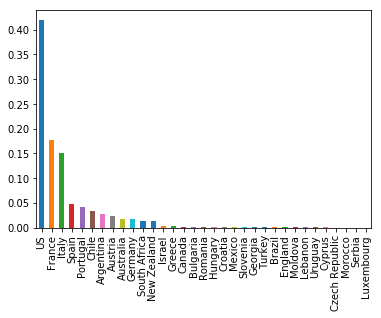

In [78]:
PRIORS.plot(kind='bar')

In [79]:
# labels

In [80]:
data = []
for i in PRIORS.index:
    for j in COMPS:
        t = (i, j)
        r = pc_given_label(j, 'doc_label', i)
        if 1 not in r.index.values:
            data.append([i, j, 0., 1.])
        elif -1 not in r.index.values:
            data.append([i, j, 1., 0.])
        else:
            data.append([i, j] + r.tolist())

In [81]:
P = pd.DataFrame(data, columns=['doc_label', 'pc_name', 'A', 'B'])

In [82]:
P.set_index(['doc_label', 'pc_name'])['A'].unstack().style.background_gradient(cmap='YlGn')

pc_name,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_label,,,,,,,,,,
Argentina,0.725,0.907143,0.8,0.807143,0.903571,0.892857,0.575,0.542857,0.585714,0.5
Australia,0.535912,0.734807,0.839779,0.674033,0.569061,0.546961,0.502762,0.535912,0.618785,0.668508
Austria,0.831933,0.537815,0.584034,0.62605,0.684874,0.567227,0.655462,0.537815,0.802521,0.689076
Brazil,0.75,0.75,0.75,0.75,1,1,0.5,0.5,0.75,0.75
Bulgaria,0.818182,0.909091,0.818182,0.727273,0.909091,0.545455,0.727273,0.909091,0.727273,0.636364
Canada,0.611111,0.833333,0.888889,0.555556,0.5,0.611111,0.611111,0.666667,0.555556,0.555556
Chile,0.648649,0.921922,0.774775,0.801802,0.873874,0.867868,0.633634,0.54955,0.612613,0.543544
Croatia,0.714286,0,0.571429,0.571429,0.714286,0.571429,0.571429,0.857143,0.571429,0.714286
Cyprus,1,0,1,0.5,0.5,0,1,0.5,0.5,1


In [83]:
P.set_index(['doc_label', 'pc_name'])['B'].unstack().style.background_gradient(cmap='YlGn')

pc_name,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_label,,,,,,,,,,
Argentina,0.275,0.0928571,0.2,0.192857,0.0964286,0.107143,0.425,0.457143,0.414286,0.5
Australia,0.464088,0.265193,0.160221,0.325967,0.430939,0.453039,0.497238,0.464088,0.381215,0.331492
Austria,0.168067,0.462185,0.415966,0.37395,0.315126,0.432773,0.344538,0.462185,0.197479,0.310924
Brazil,0.25,0.25,0.25,0.25,0,0,0.5,0.5,0.25,0.25
Bulgaria,0.181818,0.0909091,0.181818,0.272727,0.0909091,0.454545,0.272727,0.0909091,0.272727,0.363636
Canada,0.388889,0.166667,0.111111,0.444444,0.5,0.388889,0.388889,0.333333,0.444444,0.444444
Chile,0.351351,0.0780781,0.225225,0.198198,0.126126,0.132132,0.366366,0.45045,0.387387,0.456456
Croatia,0.285714,1,0.428571,0.428571,0.285714,0.428571,0.428571,0.142857,0.428571,0.285714
Cyprus,0,1,0,0.5,0.5,1,0,0.5,0.5,0


#  Predicting Topics for PCs

In [84]:
def predict_topic_from_comp(pc='PC0', n=100, alpha=.01):
    pc_words = V.loc[V[pc] > 0].sort_values(pc).tail(n).token_str.index
    T = V.loc[pc_words, TOPICS]
    X = np.log(T + alpha).sum()
    max_t = X.idxmax()
    t_n = int(max_t.replace('T', ''))
    pc_n = int(pc.replace('PC', ''))
    t_words = topics.loc[t_n].topic_words
    pc_words = pca_items.loc[pc_n].pos
    pc_words_neg = pca_items.loc[pc_n].neg
    print(max_t, t_words)
    print(pc, '+', pc_words)
    print(pc, '-', pc_words_neg)
    print('-' * 80)
#     X.sort_values().plot(kind='bar')

In [85]:
_ = pca_items.apply(lambda x: predict_topic_from_comp('PC{}'.format(x.name)),  1)

T18 acidity crisp flavors ripe texture fruits character fruit fresh fruity 
PC0 + apple crisp citrus acidity lemon peach pear fresh white light lime fruity green bright clean
PC0 - black tannins cherry cabernet blackberry plum dark berry chocolate spice licorice firm red pepper merlot
--------------------------------------------------------------------------------
T12 tannins fruits fruit acidity ripe black rich structure wood aging 
PC1 + fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years
PC1 - aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
--------------------------------------------------------------------------------
T4 tannins cherry black aromas alongside offers berry red spice pepper 
PC2 + red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits
PC2 - flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic va

# New Way to Relate Topics to Comps

We take the  dot product and grab the extrema from  each component column. These then form oppositions.

In [86]:
X.head()

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
topic_id,,,,,,,,,,
T0,55.572905,-19.035352,0.392320,-5.361083,-10.459766,-0.202635,-11.538422,-12.014772,29.107713,-22.464866
T1,-43.293671,19.185062,-61.210009,22.363837,4.771767,-54.153605,3.500383,-39.938482,-20.651142,-1.170011
T2,-15.900525,-1.489549,-5.526528,5.254166,-10.369038,-13.508510,-3.054471,-1.412475,8.033319,7.079071
T3,-20.532470,-14.364066,4.902194,2.930619,-3.451223,-10.445214,-12.002068,-0.708639,28.828211,0.089710
T4,-84.230429,-36.601570,90.101959,-8.556573,-22.291772,-11.292844,10.178888,-10.883875,-20.639621,3.784770


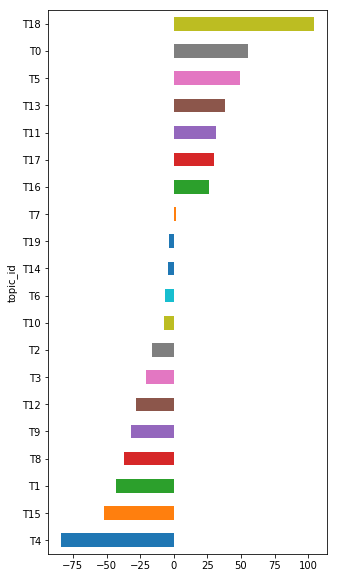

In [87]:
X.T.iloc[0].sort_values().plot(kind='barh', figsize=(5,10))

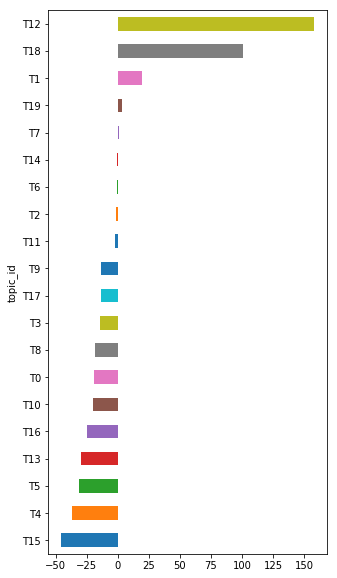

In [88]:
X.T.iloc[1].sort_values().plot(kind='barh', figsize=(5,10))

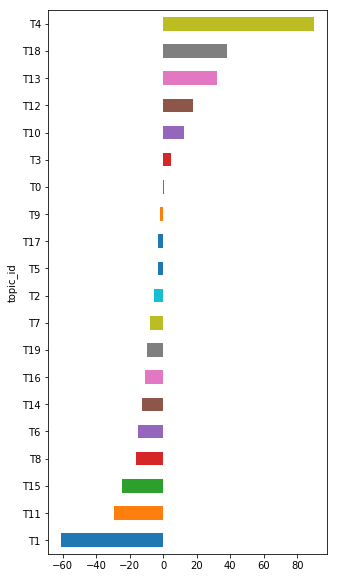

In [89]:
X.T.iloc[2].sort_values().plot(kind='barh', figsize=(5,10))

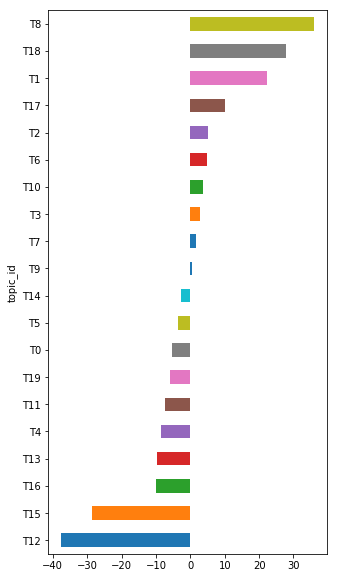

In [90]:
X.T.iloc[3].sort_values().plot(kind='barh', figsize=(5,10))

In [91]:
extrema = []
for i in range(4):
    extrema.append((X.T.iloc[i].sort_values().idxmax(), X.T.iloc[i].sort_values().idxmin()))

In [92]:
extrema

[('T18', 'T4'), ('T12', 'T15'), ('T4', 'T1'), ('T8', 'T12')]